Importing all the necessary libraries 

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from PIL import Image
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense,Dropout,Flatten,MaxPooling2D
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score,precision_score,f1_score,recall_score,confusion_matrix,ConfusionMatrixDisplay,classification_report

C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


Reading the data

In [2]:
directory='E:\Projects\Emotion Detector\Datasets'

In [3]:
data=ImageDataGenerator(rescale=1./255,rotation_range=40,zoom_range=0.2,width_shift_range=0.1,height_shift_range=0.1,horizontal_flip=True,fill_mode='nearest')

In [4]:
test_data=ImageDataGenerator(rescale=1./255)

In [5]:
train_dir=os.path.join(directory,'train')

In [6]:
test_dir=os.path.join(directory,'test')

In [7]:
training_data=data.flow_from_directory(train_dir,class_mode='categorical',color_mode='rgb',target_size=(224,224),batch_size=64,subset='training')

Found 28709 images belonging to 7 classes.


In [8]:
testing_data=test_data.flow_from_directory(test_dir,class_mode='categorical',color_mode='rgb',target_size=(224,224),batch_size=64)

Found 7178 images belonging to 7 classes.


In [9]:
np.unique(training_data.classes)

array([0, 1, 2, 3, 4, 5, 6])

In [10]:
training_data.class_indices

{'angry': 0,
 'disgust': 1,
 'fear': 2,
 'happy': 3,
 'neutral': 4,
 'sad': 5,
 'surprise': 6}

In [11]:
classes=np.array(training_data.classes)

In [12]:
class_weights=compute_class_weight(class_weight='balanced',classes=np.unique(classes),y=classes)

In [13]:
class_weights

array([1.02660468, 9.40661861, 1.00104606, 0.56843877, 0.82603942,
       0.84912748, 1.29337298])

In [14]:
dictionary=dict(enumerate(class_weights))

In [15]:
dictionary

{0: 1.0266046844269623,
 1: 9.406618610747051,
 2: 1.0010460615781582,
 3: 0.5684387684387684,
 4: 0.8260394187886635,
 5: 0.8491274770777877,
 6: 1.293372978330405}

In [16]:
import tensorflow.keras
resnet=tensorflow.keras.applications.ResNet50V2(input_shape=(224,224,3),include_top=False,weights='imagenet')

In [17]:
resnet.trainable=True

In [18]:
for layer in resnet.layers[:-50]:
    layer.trainable=False

In [19]:
from tensorflow.keras.layers import BatchNormalization
model=Sequential([resnet,Dropout(0.25),BatchNormalization(),Flatten(),Dense(64,activation='relu'),BatchNormalization(),Dropout(0.5),Dense(7,activation='softmax')])

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 dropout (Dropout)           (None, 7, 7, 2048)        0         
                                                                 
 batch_normalization (Batch  (None, 7, 7, 2048)        8192      
 Normalization)                                                  
                                                                 
 flatten (Flatten)           (None, 100352)            0         
                                                                 
 dense (Dense)               (None, 64)                6422592   
                                                                 
 batch_normalization_1 (Bat  (None, 64)                256       
 chNormalization)                                       

In [21]:
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [22]:
file="E:\Projects\Emotion Detector\Models"
checkpoint=os.path.join(file,'resnet.keras')

In [23]:
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau,ModelCheckpoint,CSVLogger

In [24]:
cp=ModelCheckpoint(filepath=checkpoint,verbose=1,save_best_only=True,mode='min',monitor='val_loss')

In [25]:
lr=ReduceLROnPlateau(monitor='val_loss',factor=0.3,patience=12,min_delta=0,verbose=1)

In [26]:
es=EarlyStopping(verbose=1,monitor='val_loss',patience=12,restore_best_weights=True)

In [27]:
csv=CSVLogger(os.path.join(file,'training_restnet.log'))

In [28]:
cb=[cp,es,lr,csv]

In [29]:
history=model.fit(training_data,validation_data=testing_data,class_weight=dictionary,epochs=50,callbacks=cb)

Epoch 1/50


449/449 [==============================] - ETA: 0s - loss: 1.9384 - accuracy: 0.3174
Epoch 1: val_loss improved from inf to 32.30572, saving model to E:\Projects\Emotion Detector\Models\resnet.keras
449/449 [==============================] - 1776s 4s/step - loss: 1.9384 - accuracy: 0.3174 - val_loss: 32.3057 - val_accuracy: 0.2485 - lr: 0.0010
Epoch 2/50
449/449 [==============================] - ETA: 0s - loss: 1.5669 - accuracy: 0.4109
Epoch 2: val_loss improved from 32.30572 to 21.19377, saving model to E:\Projects\Emotion Detector\Models\resnet.keras
449/449 [==============================] - 2433s 5s/step - loss: 1.5669 - accuracy: 0.4109 - val_loss: 21.1938 - val_accuracy: 0.1995 - lr: 0.0010
Epoch 3/50
449/449 [==============================] - ETA: 0s - loss: 1.5801 - accuracy: 0.4289  
Epoch 3: val_loss improved from 21.19377 to 1.34507, saving model to E:\Projects\Emotion Detector\Models\resnet.keras
449/449 [==============================] - 28802s 64s/step - lo

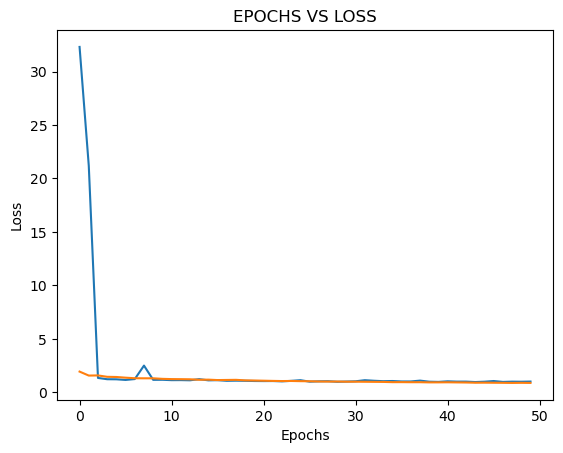

In [31]:
plt.plot(history.history['val_loss'],label='validation')
plt.plot(history.history['loss'],label='training')
plt.title('EPOCHS VS LOSS')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

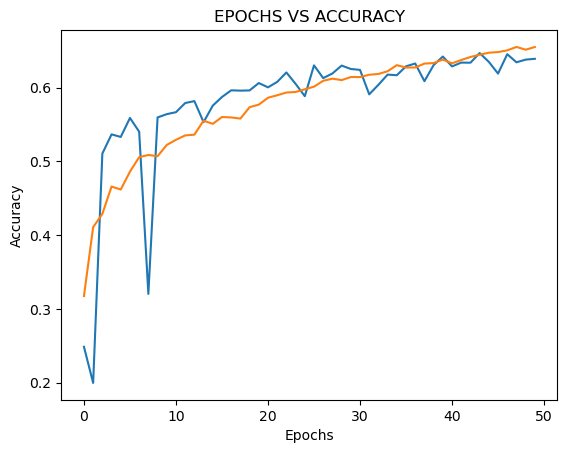

In [32]:
plt.plot(history.history['val_accuracy'],label='validation')
plt.plot(history.history['accuracy'],label='training')
plt.title('EPOCHS VS ACCURACY')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

In [35]:
model_path = 'E:\\Projects\\Emotion Detector\\Models\\final.h5'

In [36]:
model.save(model_path)

In [38]:
detector=tensorflow.keras.models.load_model(model_path)

In [41]:
path="E:\Downloads\disgust8.jpg"

In [42]:
image=cv.imread(path)

In [43]:
image=cv.cvtColor(image,cv.COLOR_BGR2RGB)

In [44]:
image.shape

(2688, 1512, 3)

In [47]:
image=cv.resize(image,(224,224))

In [48]:
image.shape

(224, 224, 3)

In [49]:
image=image.reshape((1,)+image.shape)

In [51]:
image.shape

(1, 224, 224, 3)

In [53]:
np.argmax(detector.predict(image))

1/1 [==============================] - 0s 147ms/step


2

In [54]:
training_data.class_indices

{'angry': 0,
 'disgust': 1,
 'fear': 2,
 'happy': 3,
 'neutral': 4,
 'sad': 5,
 'surprise': 6}

In [56]:
classes=[i for i in training_data.class_indices.keys()]

In [57]:
classes

['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

In [58]:
classes[2]

'fear'

In [71]:
image_testing_path='E:\\Projects\\Emotion Detector\\Datasets\\testing'

1/1 [==============================] - 0s 103ms/step


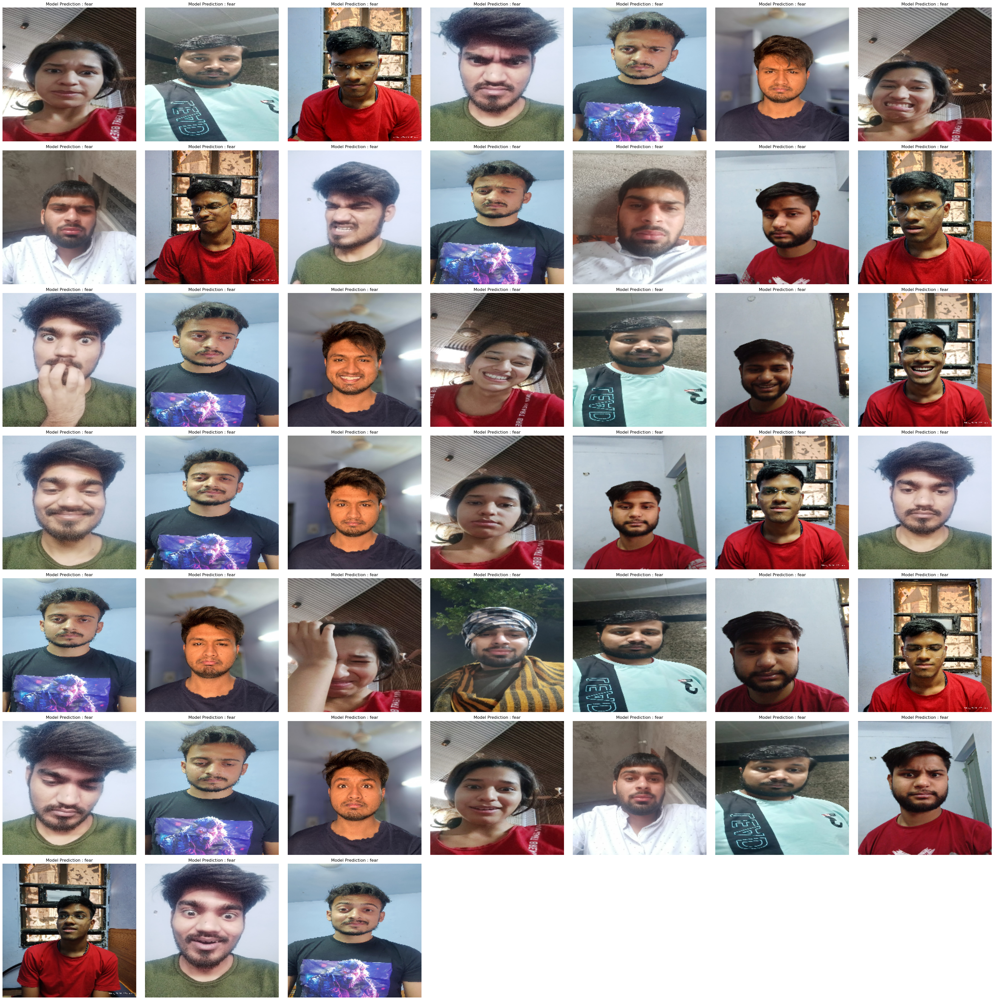

In [79]:
plt.figure(figsize=(40,40))
c=1
for img in os.listdir(image_testing_path):
    path=os.path.join(image_testing_path,str(img))
    image=cv.imread(path)
    image=cv.cvtColor(image,cv.COLOR_BGR2RGB)
    image=cv.resize(image,(224,224))
    image_new=image.reshape((1,)+image.shape)
    plt.subplot(7,7,c)
    plt.imshow(image)
    pred=np.argmax(detector.predict(image_new))
    label=classes[pred]
    plt.title(f'Model Prediction : {label}')
    c+=1
    plt.axis('off')
plt.tight_layout()
plt.show()

In [80]:
true_classes=testing_data.classes

In [81]:
true_classes

array([0, 0, 0, ..., 6, 6, 6])

In [87]:
predicted_classes=np.argmax(detector.predict(testing_data),axis=1)

113/113 [==============================] - 254s 2s/step


In [88]:
predicted_classes

array([3, 6, 6, ..., 6, 6, 3], dtype=int64)

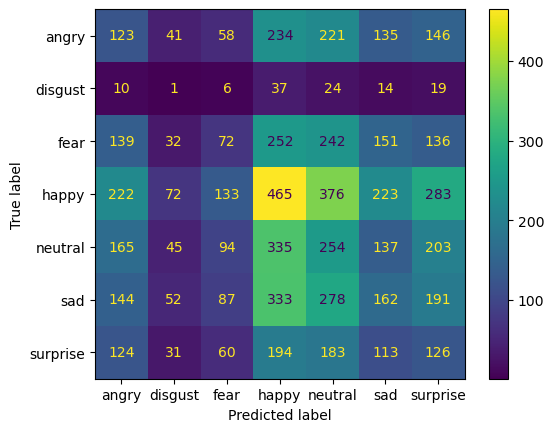

In [89]:
ConfusionMatrixDisplay(confusion_matrix(true_classes,predicted_classes),display_labels=training_data.class_indices.keys()).plot()

In [90]:
accuracy_score(true_classes,predicted_classes)

0.1675954304820284

In [91]:
true_classes=training_data.classes
predicted_classes=np.argmax(detector.predict(training_data),axis=1)

449/449 [==============================] - 1120s 2s/step


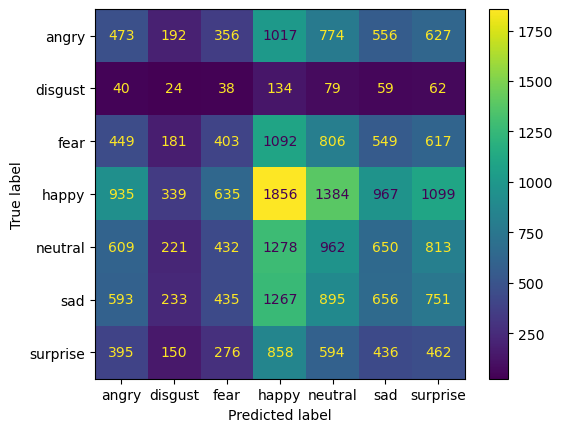

In [92]:
ConfusionMatrixDisplay(confusion_matrix(true_classes,predicted_classes),display_labels=training_data.class_indices.keys()).plot()

In [94]:
model

449/449 [==============================] - 995s 2s/step


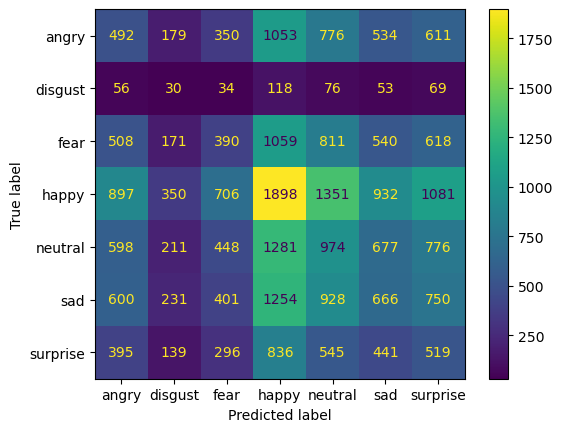

In [95]:
predicted_classes=np.argmax(model.predict(training_data),axis=1)
ConfusionMatrixDisplay(confusion_matrix(true_classes,predicted_classes),display_labels=training_data.class_indices.keys()).plot()

In [97]:
model.save_weights('E:\\Projects\\Emotion Detector\\Models\\final_weights.h5')